In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
#import scanorama
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

### Глобальные переменные

In [2]:
qc_palette = sns.color_palette(['red', 'gray'])

In [3]:
layer_palette = {'Empty spots': '#1f77b4',
                 'WM': '#bcbd22',
                 'L1': '#ff7f0e',
                 'L6': '#e377c2',
                 'L2': '#2ca02c',
                 'L3': '#d62728',
                 'L4': '#9467bd',
                 'L5': '#8c564b'}

In [4]:
def compute_3mad_intervals(df, column):
    mad = df[column].mad()
    median = df[column].median()
    left_mad  = median - 3 * mad
    right_mad = median + 3 * mad
    print(f'median = {median}, {[left_mad, right_mad]}')
    return median, left_mad, right_mad

# Подгрузим файлы

In [5]:
# Define paths and get sample_ids
file_list = os.listdir('../data/raw_spatial_data/chimp/')
file_list

['chimp_11454', 'chimp_13302', 'chimp_13309', 'chimp_j11', 'chimp_j8']

In [6]:
file = 'chimp_j11'

In [7]:
# аннотация слоёв
ann = pd.read_csv('../data/clusters/' + file + '.csv', index_col=0)
ann.columns = ['label']
ann.head()

,label
Barcode,
AAACAACGAATAGTTC-1,L6
AAACAAGTATCTCCCA-1,WM
AAACAATCTACTAGCA-1,WM
AAACACCAATAACTGC-1,L5
AAACAGAGCGACTCCT-1,L6


In [8]:
# каунты секвенирования
adata = sc.read_visium('../data/raw_spatial_data/chimp/'+ file)
adata.var_names_make_unique()
adata.obs['label'] = ann.label
adata.obs['sample_id'] = file

reading ..\data\raw_spatial_data\chimp\chimp_j11\filtered_feature_bc_matrix.h5
 (0:00:00)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Проверим все ли споты имеют аннотацию

In [9]:
adata.obs.label.notna().value_counts()

True     4885
False       2
Name: label, dtype: int64

In [10]:
adata.obs.label.value_counts()

WM             2416
L6             1285
L5              597
L4              203
L3              200
Empty spots     184
Name: label, dtype: int64

# adata

## Посчитаем метрики

In [11]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['hb'] = adata.var_names.str.contains(("^HB[AB]"))
adata.var['ribo'] = adata.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=['mt','hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

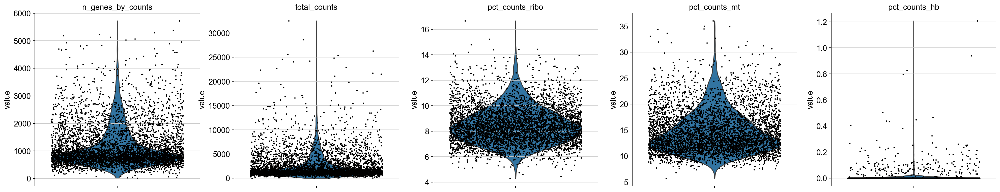

In [12]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, rotation= 45, multi_panel=True, size=2.5)

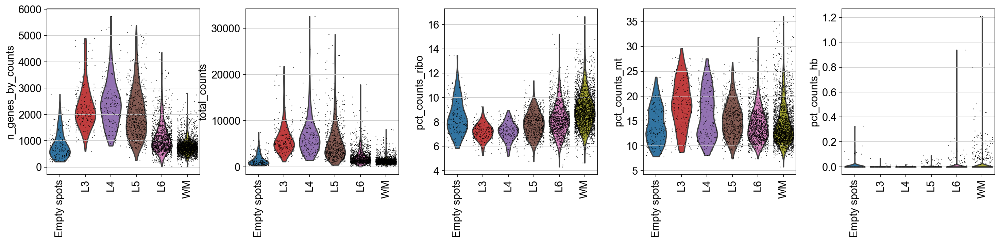

In [13]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo','pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, groupby = 'label', rotation= 90, palette=layer_palette)

Видим, что число каунтов и задетектированых генов занижено у `L6`, и `WM` слоёв. Поэтому хотелось бы быть с ними аккуратнее. Хочется заметить высокий процент митохондриальных генов в `L3` и `L4`

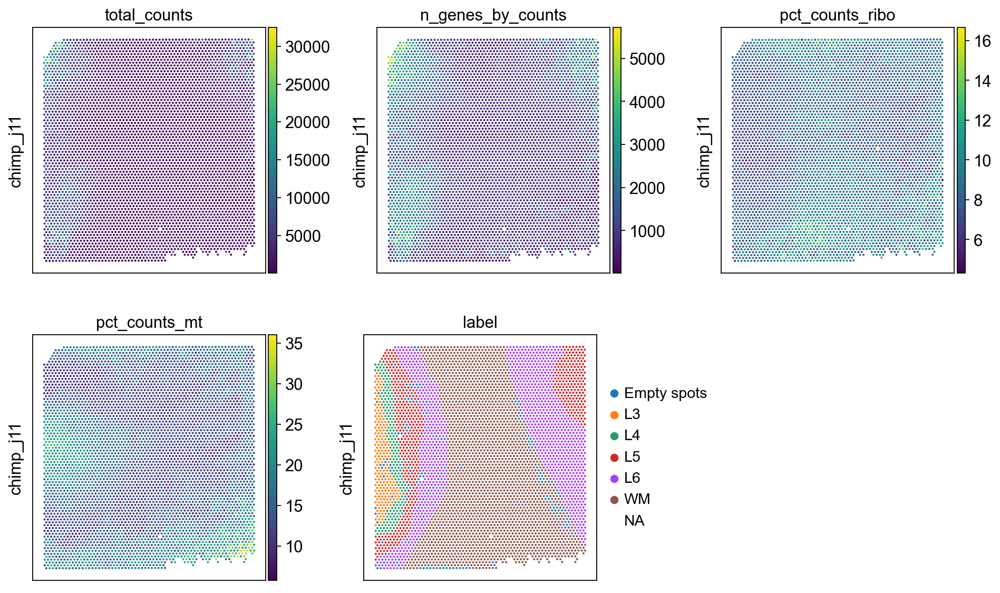

In [14]:
sq.pl.spatial_scatter(adata,
                      color = ['total_counts', 'n_genes_by_counts','pct_counts_ribo','pct_counts_mt', 'label'],
                      ncols=3, img=False, axis_label=['', file])

### Libriary size

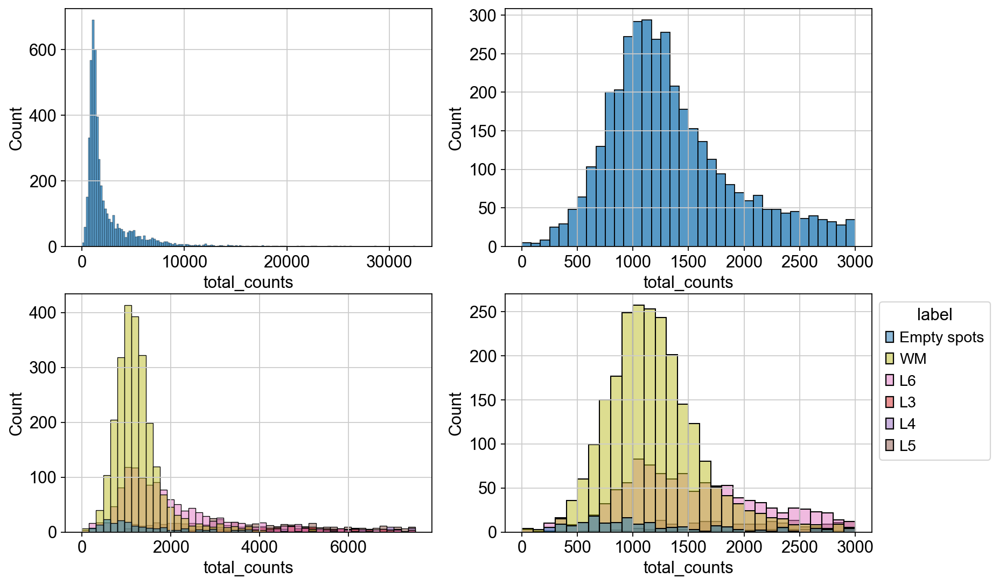

In [15]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM','L6','L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='total_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 7500], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='total_counts', binrange=[0, 3000], ax=axs[0][1])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 3000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Видим, что большинство спотов низкого качества пришло из `WM`. Посмотрим на остальные споты

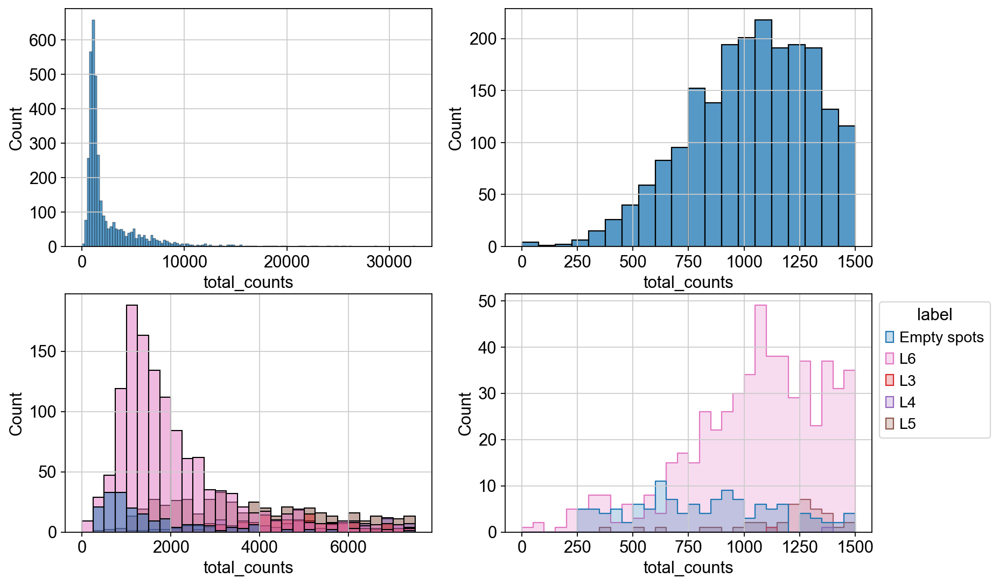

In [16]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'L6','L3', 'L4', 'L5']

sns.histplot(adata.obs[adata.obs.label != 'L6'], x='total_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 7500], bins=30, hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs[adata.obs.label != 'L6'], bins=20, x='total_counts', binrange=[0, 1500], ax=axs[0][1])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 1500], bins=30, hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Посчитаем 3MAD интервалы

In [17]:
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'total_counts')

median = 1421.0, [-3818.5406494140625, 6660.5406494140625]


Выберем порог по `total counts = 2000`. Поставим порог для `L6` и для всех остальных по отдельности

In [18]:
adata.obs['qc_lib_size'] = (((adata.obs['total_counts'] > 1000) & (adata.obs['total_counts'] < 25000)) |
                            ((adata.obs['total_counts'] > 500) & (adata.obs.label == 'L6')) |
                            ((adata.obs['total_counts'] > 450) & (adata.obs.label == 'WM'))).astype('string')
#adata.obs['qc_lib_size'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)

vc = adata.obs.groupby('qc_lib_size')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_lib_size'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=170

label
Empty spots    87
L6             38
WM             34
L5              9
L4              2
Name: label, dtype: int64


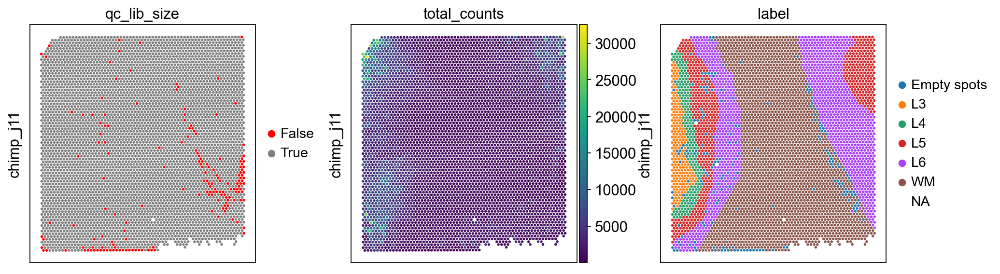

In [19]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_lib_size', 'total_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Number of expressed features

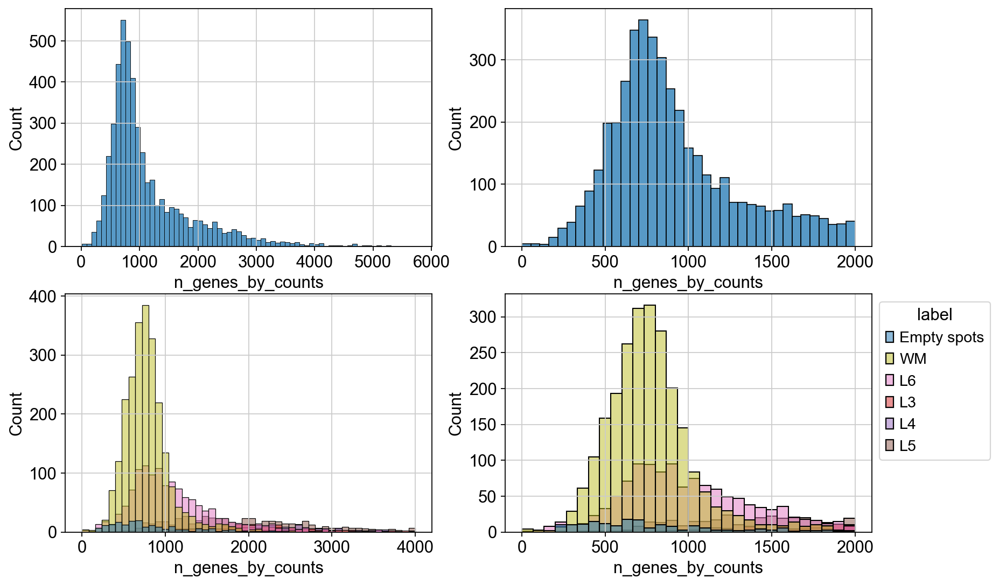

In [20]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM','L6','L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 4000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 2000], ax=axs[0][1])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 2000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Видим, что большинство спотов низкого качества пришло из `WM`. Посмотрим на остальные споты

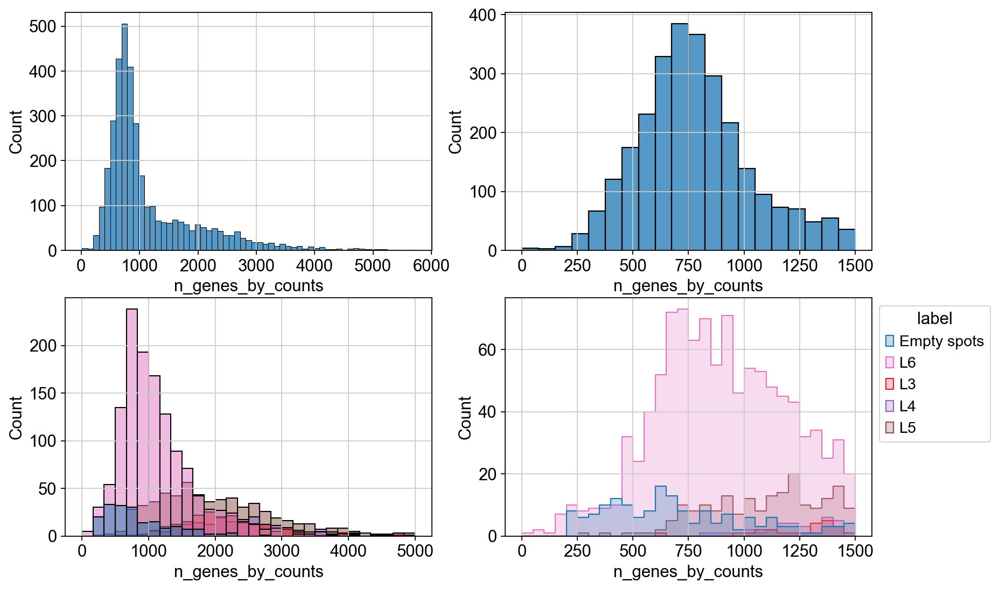

In [21]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots','L6','L3', 'L4', 'L5']

sns.histplot(adata.obs[adata.obs.label != 'L6'], x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 5000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs[adata.obs.label != 'L6'], bins=20, x='n_genes_by_counts', binrange=[0, 1500], ax=axs[0][1])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 1500], bins=30, hue='label', fill=True, element="step", hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Выберем порог по `total n_genes_by_counts = 1000`. Поставим порог для `WM` и для всех остальных по отдельности

In [22]:
adata.obs['qc_n_genes'] = (((adata.obs['n_genes_by_counts'] > 600)) | 
                           ((adata.obs['n_genes_by_counts'] > 400) & (adata.obs.label == 'L6')) |
                           ((adata.obs['n_genes_by_counts'] > 350) & (adata.obs.label == 'WM'))).astype('string')
#adata.obs['qc_n_genes'].replace({True: 'True', False: 'False'}, inplace=True)
vc = adata.obs.groupby('qc_n_genes')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_n_genes'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=183

label
Empty spots    68
WM             62
L6             48
L5              5
Name: label, dtype: int64


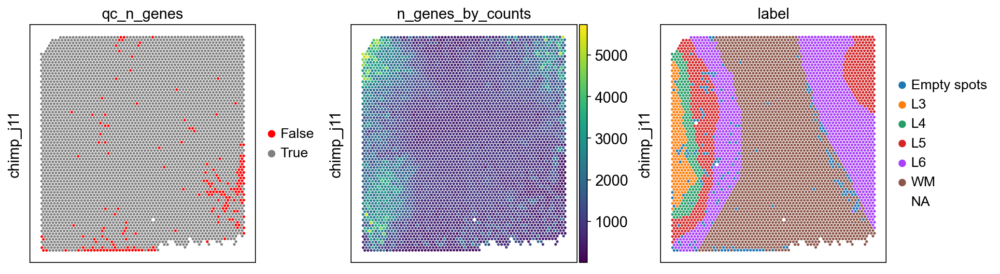

In [23]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_n_genes', 'n_genes_by_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of mitochondrial reads

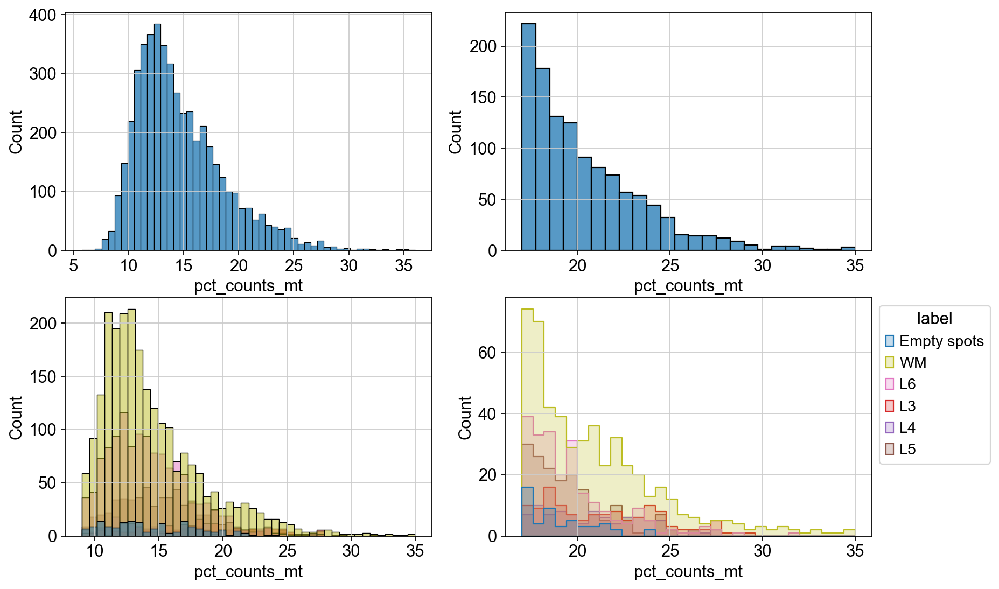

In [24]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM','L6','L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='pct_counts_mt', ax=axs[0][0])
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[9, 35], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[17, 35], ax=axs[0][1])
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[17, 35], hue='label', bins=30, hue_order=hue_order, ax=axs[1][1], fill=True, element="step", palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Поставим для всех не из `WM` порог `pct_counts_mt = 25`, а для `WM` порог `pct_counts_mt = 32`.

In [25]:
adata.obs['qc_mt'] = (((adata.obs['pct_counts_mt'] <= 25) & (adata.obs.label != 'WM'))
                           | ((adata.obs['pct_counts_mt'] < 25) & (adata.obs.label == 'WM'))).astype('string')
#adata.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = adata.obs.groupby('qc_mt')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_mt'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=97

label
WM    60
L3    15
L6    10
L4     7
L5     5
Name: label, dtype: int64


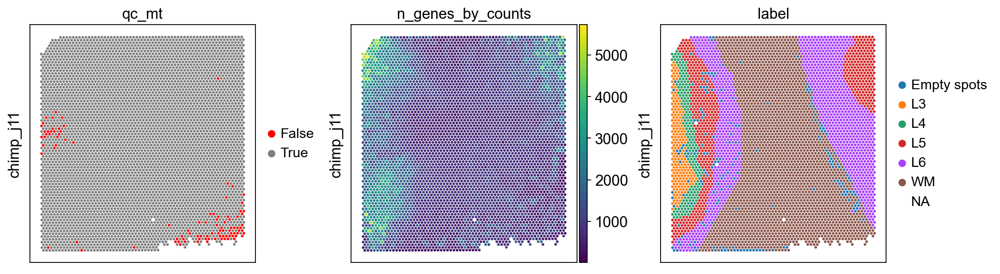

In [26]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_mt', 'n_genes_by_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of ribosomal reads

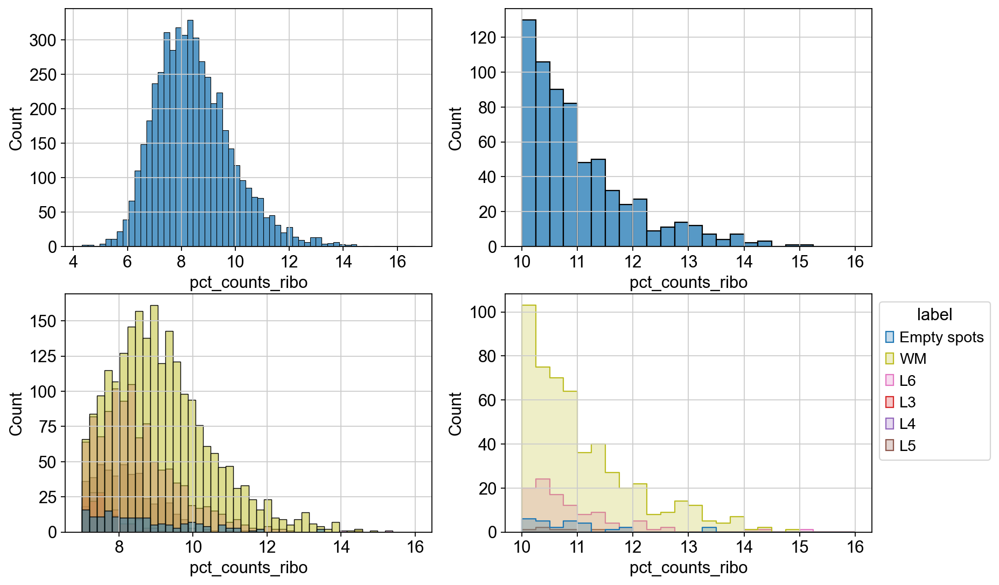

In [27]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM','L6','L3', 'L4', 'L5']

sns.histplot(adata.obs, x='pct_counts_ribo', ax=axs[0][0])
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[7, 16], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[10, 16], ax=axs[0][1])
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[10, 16], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Посчитаем 3MAD

In [28]:
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'pct_counts_ribo')

median = 8.295820236206055, [4.942344069480896, 11.649296402931213]


Выберем порог `pct_counts_ribo = 13`

In [29]:
adata.obs['qc_ribo'] = ((adata.obs['pct_counts_ribo'] <= 13)).astype('string')
#human_759.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = adata.obs.groupby('qc_ribo')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_ribo'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=38

label
WM             33
L6              3
Empty spots     2
Name: label, dtype: int64


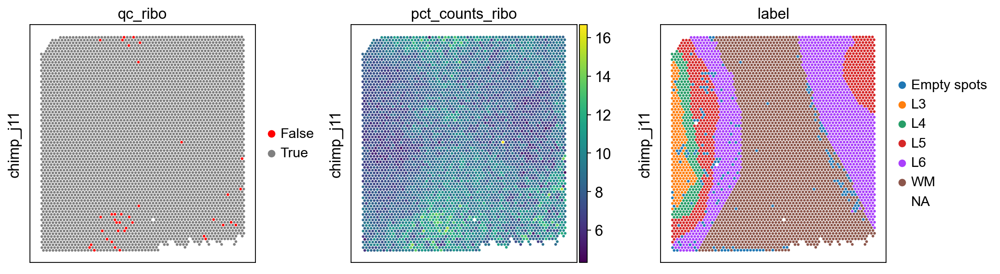

In [30]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_ribo', 'pct_counts_ribo', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of hemoglobin reads

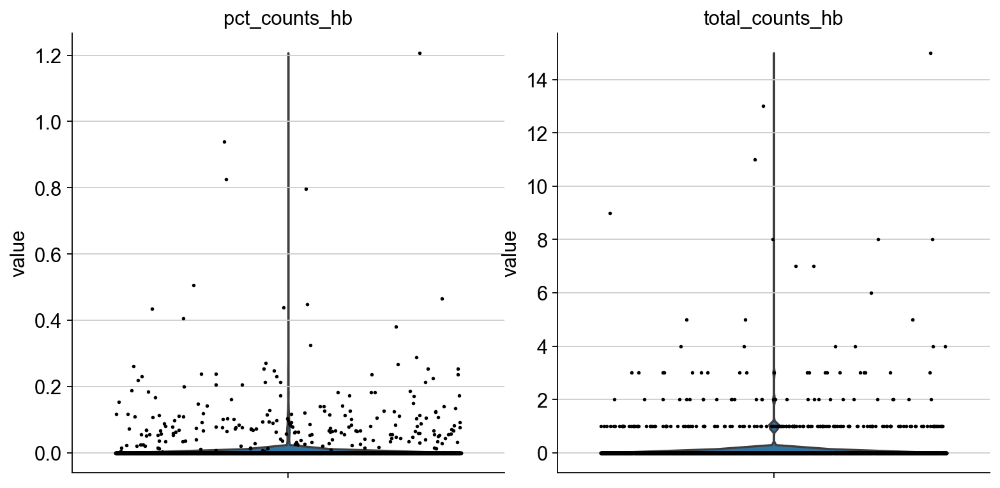

In [31]:
sc.pl.violin(adata,
             keys = ['pct_counts_hb', 'total_counts_hb'], jitter=0.4, size=2.5, multi_panel=True)

Посчитаем 3MAD

In [32]:
median_pct, left_3mad_pct, right_3mad_pct = compute_3mad_intervals(adata.obs, 'pct_counts_hb')
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'total_counts_hb')

median = 0.0, [-0.03107073437422514, 0.03107073437422514]
median = 0.0, [-0.4723058491945267, 0.4723058491945267]


In [33]:
adata.obs['qc_hb'] = ((adata.obs['pct_counts_hb'] <= 1) &
                      (adata.obs['total_counts_hb'] <= 10)).astype('string')
#human_759.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = adata.obs.groupby('qc_hb')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_hb'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=3

label
WM    3
Name: label, dtype: int64


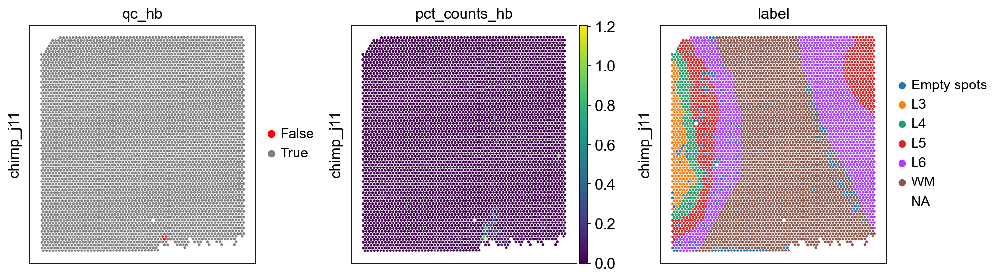

In [34]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_hb', 'pct_counts_hb', 'label'], img=False, axis_label=['', file], size=1.3)

## Combined

### QC spatial_scatter

In [35]:
d = {'True': True, 'False': False}
adata.obs['qc_lib_size'] = adata.obs['qc_lib_size'].astype(object).replace(d)
adata.obs['qc_n_genes'] = adata.obs['qc_n_genes'].astype(object).replace(d)
adata.obs['qc_mt'] = adata.obs['qc_mt'].astype(object).replace(d)
adata.obs['qc_ribo'] = adata.obs['qc_ribo'].astype(object).replace(d)
adata.obs['qc_hb'] = adata.obs['qc_hb'].astype(object).replace(d)

In [36]:
adata.obs['qc_good_spots'] = (adata.obs.qc_lib_size * adata.obs.qc_n_genes *
                              adata.obs.qc_mt * adata.obs.qc_ribo * adata.obs.qc_hb).astype('string')
vc = adata.obs.groupby('qc_good_spots')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_good_spots'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=317

label
WM             137
Empty spots     87
L6              56
L3              15
L5              13
L4               9
Name: label, dtype: int64


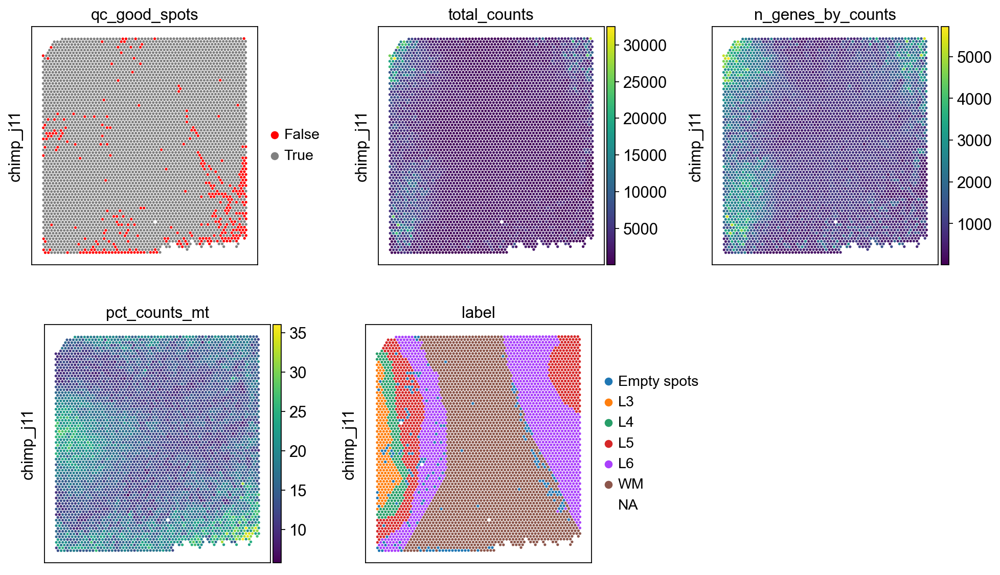

In [37]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_good_spots',  'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'label'],
                          img=False, axis_label=['', file], size=1.3, ncols=3)

### QC scatter plots

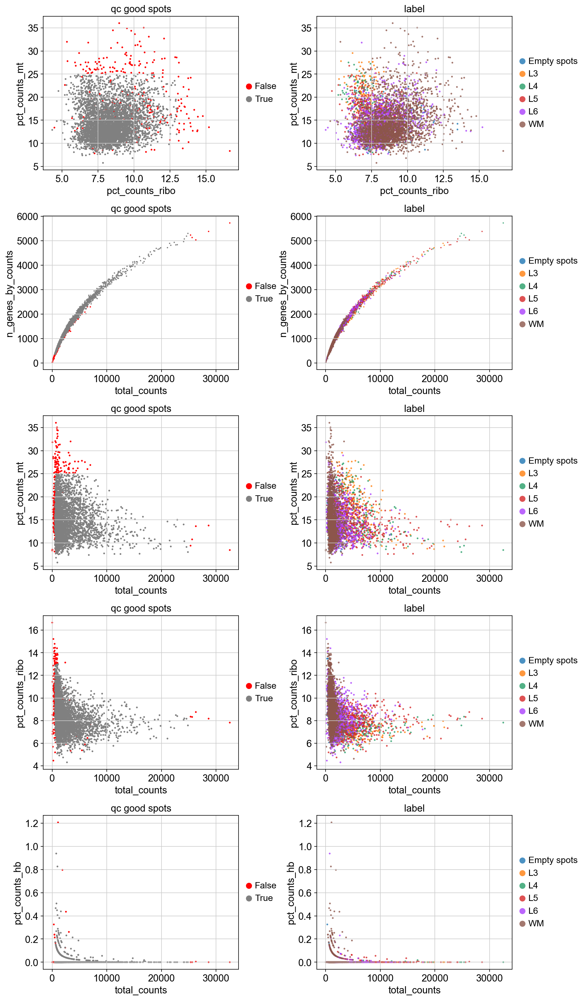

In [38]:
fig, ax = plt.subplots(5, 2, figsize=(12, 25), gridspec_kw={'wspace': 0.4, 'hspace': 0.3})
alpha = 0.8

sc.pl.scatter(adata, x='pct_counts_ribo', y='pct_counts_mt', color="qc_good_spots", ax=ax[0][0], show=False, size=25)
sc.pl.scatter(adata, x='pct_counts_ribo', y='pct_counts_mt', color="label", ax=ax[0][1], show=False, size=25, alpha=alpha)

sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="qc_good_spots", ax=ax[1][0], show=False, size=15)
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="label", ax=ax[1][1], show=False, alpha=alpha, size=15)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="qc_good_spots", ax=ax[2][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="label", ax=ax[2][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="qc_good_spots", ax=ax[3][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="label", ax=ax[3][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="qc_good_spots", ax=ax[4][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="label", ax=ax[4][1], show=False, alpha=alpha, size=25)

plt.show()

### Cохраним отфильтрованые споты (без пустых)

In [39]:
good_spots = adata.obs[(adata.obs.qc_good_spots == 'True') & (adata.obs.label != 'Empty spots')].index

In [40]:
adata_filtered = adata[good_spots].copy()

### PCA

In [41]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.tl.pca(adata)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:17)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


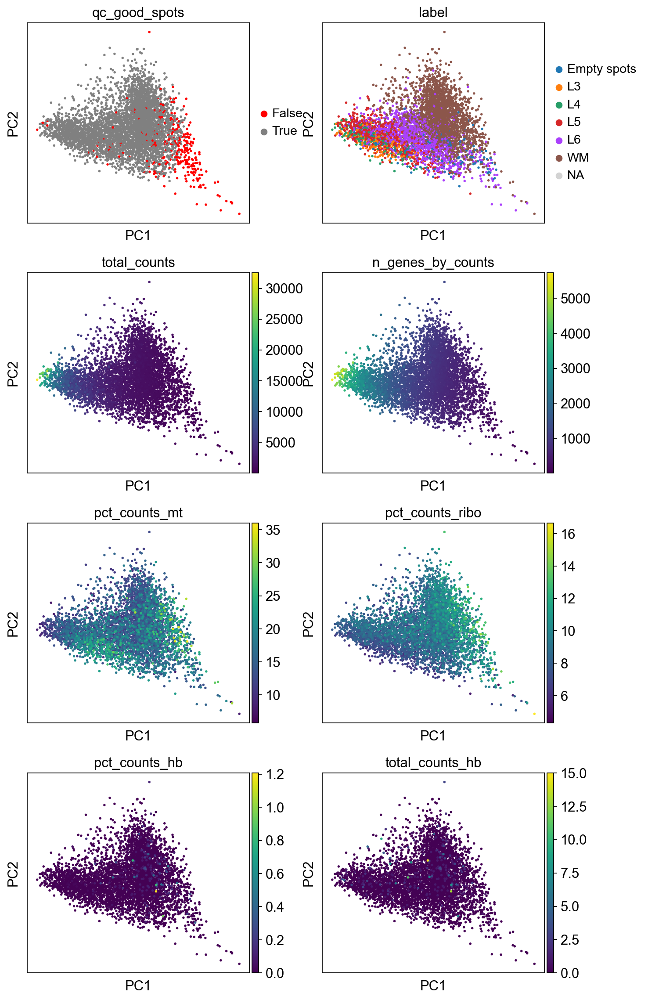

In [42]:
sc.pl.pca(adata, 
          color=['qc_good_spots', 'label', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'total_counts_hb'],
          ncols=2, show=True)

## Сохраним в .h5ad

In [43]:
adata_filtered.obs.drop(['qc_lib_size','qc_n_genes', 'qc_good_spots', 'qc_mt', 'qc_hb', 'qc_ribo'], axis=1, inplace=True)

In [44]:
adata_filtered.obs.head()

,in_tissue,array_row,array_col,label,sample_id,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_hb,pct_counts_hb,total_counts_ribo,pct_counts_ribo
AAACAACGAATAGTTC-1,1,0,16,L6,chimp_j11,1811,4306.0,710.0,16.488621,0.0,0.0,410.0,9.521598
AAACAAGTATCTCCCA-1,1,50,102,WM,chimp_j11,784,1220.0,155.0,12.704918,0.0,0.0,104.0,8.524590
AAACAATCTACTAGCA-1,1,3,43,WM,chimp_j11,663,1066.0,186.0,17.448406,0.0,0.0,102.0,9.568480
AAACACCAATAACTGC-1,1,59,19,L5,chimp_j11,2022,4524.0,616.0,13.616268,0.0,0.0,325.0,7.183908
AAACAGAGCGACTCCT-1,1,14,94,L6,chimp_j11,1471,2617.0,285.0,10.890332,0.0,0.0,192.0,7.336645


In [45]:
os.makedirs('../results/filtered_samples', exist_ok=True)
os.makedirs('../results/filtered_samples/chimp', exist_ok=True)
adata_filtered.write_h5ad(f'../results/filtered_samples/chimp/{file}.h5ad')